In [1]:
!pip install fiftyone #> /dev/null

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.9/7.9 MB 80.1 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.9/108.9 kB 6.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 192.5/192.5 kB 13.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.6/89.6 kB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.9/59.9 kB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 21.0 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 74.3/74.3 kB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 676.9/676.9 kB 38.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 942.9/942.9 kB 48.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 kB 2.7 MB/s eta 0:00:00
   ━━━━━━━━

In [2]:
import os
import pandas as pd
import glob
import numpy as np
import torch
import cv2
import matplotlib.pyplot as plt
import xml.etree.ElementTree as ET

from sklearn import preprocessing 

from IPython.display import Image, display
from IPython import display
display.clear_output()

import fiftyone as fo
import fiftyone.utils.ultralytics as fou
import fiftyone.zoo as foz
from fiftyone import ViewField as F

import xml.etree.ElementTree as ET
from PIL import Image

from torch.utils.data import Dataset, DataLoader

import torchvision
from torchvision.transforms import transforms, Compose, Resize, RandomHorizontalFlip, ToTensor
from torchvision.models.detection import fasterrcnn_resnet50_fpn_v2, FasterRCNN_ResNet50_FPN_V2_Weights
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.rpn import AnchorGenerator

import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2

Migrating database to v0.23.7


### Download COCO-2017 Dataset (person only). Train : Validation : Test = 4000 : 500 : 500 

In [3]:
ds_train = foz.load_zoo_dataset(
    "coco-2017",
    split="train",
    dataset_name="COCO-2017-train",
    label_types=["detections"],
    classes=["person"],
    shuffle=True,
    dataset_dir='./data',
    max_samples=4000,
    seed=43
)

ds_val = foz.load_zoo_dataset(
    "coco-2017",
    split="validation",
    dataset_name="COCO-2017-val",
    label_types=["detections"],
    classes=["person"],
    shuffle=True,
    dataset_dir='./data',
    max_samples=500,
    seed=43
)

ds_test = foz.load_zoo_dataset(
    "coco-2017",
    split="test",
    dataset_name="COCO-2017-test",
    label_types=["detections"],
    classes=["person"],
    #shuffle=True,
    dataset_dir='./data',
    max_samples=500,
    seed=43
)

 100% |██████|    1.9Gb/1.9Gb [18.7s elapsed, 0s remaining, 120.3Mb/s]      
Extracting annotations to 'data/raw/instances_train2017.json'
 100% |████████████████| 4000/4000 [18.7m elapsed, 0s remaining, 3.0 images/s]      
Writing annotations for 4000 downloaded samples to './data/train/labels.json'
Dataset info written to './data/info.json'
Loading 'coco-2017' split 'train'
 100% |███████████████| 4000/4000 [34.4s elapsed, 0s remaining, 119.8 samples/s]      
Dataset 'COCO-2017-train' created
Found annotations at 'data/raw/instances_val2017.json'
 100% |██████████████████| 500/500 [2.4m elapsed, 0s remaining, 3.1 images/s]      
Writing annotations for 500 downloaded samples to './data/validation/labels.json'
Dataset info written to './data/info.json'
Loading 'coco-2017' split 'validation'
 100% |█████████████████| 500/500 [4.6s elapsed, 0s remaining, 120.9 samples/s]      
Dataset 'COCO-2017-val' created
Test split is unlabeled; ignoring classes requirement
 100% |██████|    8.7Mb/8

### Remove all ground truth bounding box & label except person

In [4]:
def pickPersonLabel(dataset):
  # Iterate over the dataset
  for sample in dataset:
      # Get the detections
      detections = sample.ground_truth.detections
      # Filter out non-person detections
      detections = [d for d in detections if d.label == "person"]
      # Update the detections
      sample.ground_truth.detections = detections
      # Save the sample
      sample.save()

pickPersonLabel(ds_train)
pickPersonLabel(ds_val)

train_classes = ds_train.distinct("ground_truth.detections.label")
val_classes = ds_val.distinct("ground_truth.detections.label")
test_classes = ds_test.distinct("ground_truth.detections.label")
print("train classes:", train_classes)
print("val classes:", val_classes)
print("test classes:", test_classes)
print(len(ds_train))
print(len(ds_val))
print(len(ds_test))

train classes: ['person']
val classes: ['person']
test classes: []
4000
500
500


### Export the dataset into Pascal VOC format

In [5]:
# The path to export the dataset
EXPORT_DIR = "./tmp/vocdetection"

classes = train_classes

ds_train.export(
    export_dir=EXPORT_DIR,
    dataset_type=fo.types.VOCDetectionDataset,
    label_field="ground_truth",
    split="train",
    classes=classes,
)

ds_val.export(
    export_dir=EXPORT_DIR,
    dataset_type=fo.types.VOCDetectionDataset,
    label_field="ground_truth",
    split="validation",
    classes=classes,
)

ds_test.export(
    export_dir=EXPORT_DIR,
    dataset_type=fo.types.VOCDetectionDataset,
    label_field="ground_truth",
    split="test",
    classes=classes,
)

Ignoring unsupported parameter 'split'
Ignoring unsupported parameter 'classes'
 100% |███████████████| 4000/4000 [11.3s elapsed, 0s remaining, 353.7 samples/s]      
Directory './tmp/vocdetection' already exists; export will be merged with existing files
Ignoring unsupported parameter 'split'
Ignoring unsupported parameter 'classes'
 100% |█████████████████| 500/500 [1.4s elapsed, 0s remaining, 362.0 samples/s]         
Directory './tmp/vocdetection' already exists; export will be merged with existing files
Ignoring unsupported parameter 'split'
Ignoring unsupported parameter 'classes'
 100% |█████████████████| 500/500 [360.7ms elapsed, 0s remaining, 1.4K samples/s]      


### Visualize one training image and its bounding box and person label

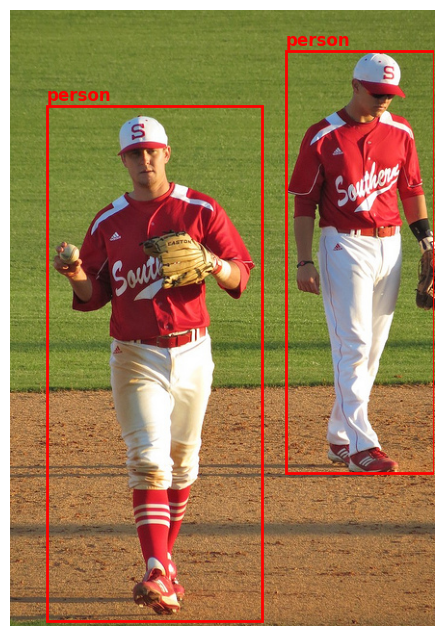

In [6]:
import cv2
import matplotlib.pyplot as plt
import xml.etree.ElementTree as ET

def visualize_image_with_boxes(image_path, annotation_path):
    # Read the image
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Parse the XML annotation file
    tree = ET.parse(annotation_path)
    root = tree.getroot()
    
    # Extract image size
    width = int(root.find('size/width').text)
    height = int(root.find('size/height').text)
    
    # Display the image
    plt.figure(figsize=(8, 8))
    plt.imshow(image)
    
    # Plot bounding boxes and annotations
    for obj in root.findall('object'):
        name = obj.find('name').text
        bbox = obj.find('bndbox')
        xmin = int(bbox.find('xmin').text)
        ymin = int(bbox.find('ymin').text)
        xmax = int(bbox.find('xmax').text)
        ymax = int(bbox.find('ymax').text)
        
        # Plot bounding box
        plt.gca().add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, 
                                           linewidth=2, edgecolor='r', facecolor='none'))
        
        # Add annotation
        plt.text(xmin, ymin - 5, name, color='r', fontsize=12, weight='bold')
    
    plt.axis('off')
    plt.show()

# Path to the image and annotation file
image_path = "/kaggle/working/tmp/vocdetection/data/000000211221.jpg"
annotation_path = "/kaggle/working/tmp/vocdetection/labels/000000211221.xml"

# Visualize the image with bounding boxes and annotations
visualize_image_with_boxes(image_path, annotation_path)

### Define XML Parser function

In [7]:
BASE_PATH = "/kaggle/working/tmp/vocdetection"
XML_PATH = os.path.join(BASE_PATH, "labels")
IMG_PATH = os.path.join(BASE_PATH, "data")
XML_FILES = [os.path.join(XML_PATH, f) for f in os.listdir(XML_PATH)]

In [8]:
class XmlParser(object):

    def __init__(self,xml_file):

        self.xml_file = xml_file
        self._root = ET.parse(self.xml_file).getroot()
        self._objects = self._root.findall("object")
        # path to the image file as describe in the xml file
        self.img_path = os.path.join(IMG_PATH, self._root.find('filename').text)
        # image id 
        self.image_id = self._root.find("filename").text
        # names of the classes contained in the xml file
        self.names = self._get_names()
        # coordinates of the bounding boxes
        self.boxes = self._get_bndbox()

    def parse_xml(self):
        """"Parse the xml file returning the root."""
    
        tree = ET.parse(self.xml_file)
        return tree.getroot()

    def _get_names(self):

        names = []
        for obj in self._objects:
            name = obj.find("name")
            names.append(name.text)

        return np.array(names)

    def _get_bndbox(self):

        boxes = []
        for obj in self._objects:
            coordinates = []
            bndbox = obj.find("bndbox")
            coordinates.append(np.int32(bndbox.find("xmin").text))
            coordinates.append(np.int32(np.float32(bndbox.find("ymin").text)))
            coordinates.append(np.int32(bndbox.find("xmax").text))
            coordinates.append(np.int32(bndbox.find("ymax").text))
            boxes.append(coordinates)

        return np.array(boxes)

### Define function to convert XML to pandas dataframe

In [9]:
def xml_files_to_df(xml_files):
    
    """"Return pandas dataframe from list of XML files."""
    
    names = []
    boxes = []
    image_id = []
    xml_path = []
    img_path = []
    for file in xml_files:
        xml = XmlParser(file)
        names.extend(xml.names)
        boxes.extend(xml.boxes)
        image_id.extend([xml.image_id] * len(xml.names))
        xml_path.extend([xml.xml_file] * len(xml.names))
        img_path.extend([xml.img_path] * len(xml.names))
    a = {"image_id": image_id,
         "names": names,
         "boxes": boxes,
         "xml_path":xml_path,
         "img_path":img_path}
    
    df = pd.DataFrame.from_dict(a, orient='index')
    df = df.transpose()
    
    return df

df = xml_files_to_df(XML_FILES)
df.head()

,image_id,names,boxes,xml_path,img_path
0,000000025424.jpg,person,"[129, 243, 315, 640]",/kaggle/working/tmp/vocdetection/labels/000000...,/kaggle/working/tmp/vocdetection/data/00000002...
1,000000391117.jpg,person,"[403, 201, 448, 279]",/kaggle/working/tmp/vocdetection/labels/000000...,/kaggle/working/tmp/vocdetection/data/00000039...
2,000000146910.jpg,person,"[0, 10, 592, 631]",/kaggle/working/tmp/vocdetection/labels/000000...,/kaggle/working/tmp/vocdetection/data/00000014...
3,000000267105.jpg,person,"[225, 179, 296, 347]",/kaggle/working/tmp/vocdetection/labels/000000...,/kaggle/working/tmp/vocdetection/data/00000026...
4,000000331271.jpg,person,"[348, 27, 373, 105]",/kaggle/working/tmp/vocdetection/labels/000000...,/kaggle/working/tmp/vocdetection/data/00000033...


In [10]:
# check values for per class
df['names'].value_counts()

names
person    18244
Name: count, dtype: int64

In [11]:
# remove .jpg extension from image_id 
df['img_id'] = df['image_id'].apply(lambda x:x.split('.')).map(lambda x:x[0])
df.drop(columns=['image_id'], inplace=True)
df.head()

,names,boxes,xml_path,img_path,img_id
0,person,"[129, 243, 315, 640]",/kaggle/working/tmp/vocdetection/labels/000000...,/kaggle/working/tmp/vocdetection/data/00000002...,000000025424
1,person,"[403, 201, 448, 279]",/kaggle/working/tmp/vocdetection/labels/000000...,/kaggle/working/tmp/vocdetection/data/00000039...,000000391117
2,person,"[0, 10, 592, 631]",/kaggle/working/tmp/vocdetection/labels/000000...,/kaggle/working/tmp/vocdetection/data/00000014...,000000146910
3,person,"[225, 179, 296, 347]",/kaggle/working/tmp/vocdetection/labels/000000...,/kaggle/working/tmp/vocdetection/data/00000026...,000000267105
4,person,"[348, 27, 373, 105]",/kaggle/working/tmp/vocdetection/labels/000000...,/kaggle/working/tmp/vocdetection/data/00000033...,000000331271


### Change person label into numeric

In [12]:
# classes need to be in int form so we use LabelEncoder for this task
enc = preprocessing.LabelEncoder()
df['labels'] = enc.fit_transform(df['names'])
# df['labels'] = np.stack(df['labels'][i]+1 for i in range(len(df['labels']))) 
df['labels'] = df['labels'].apply(lambda x: x + 1)
df['labels'] = np.stack(df['labels'])

In [13]:
classes = df[['names','labels']].value_counts()
classes

names   labels
person  1         18244
Name: count, dtype: int64

### Add bounding box coordinate and size into dataframe

In [14]:
for i in range(len(df)):
  box = df['boxes'].iloc[i]
  df.loc[i, ['xmin', 'ymin', 'xmax', 'ymax']] = box

In [15]:
# drop names column since we dont need it anymore
df.drop(columns=['names'], inplace=True)
df.head()

,boxes,xml_path,img_path,img_id,labels,xmin,ymin,xmax,ymax
0,"[129, 243, 315, 640]",/kaggle/working/tmp/vocdetection/labels/000000...,/kaggle/working/tmp/vocdetection/data/00000002...,000000025424,1,129.0,243.0,315.0,640.0
1,"[403, 201, 448, 279]",/kaggle/working/tmp/vocdetection/labels/000000...,/kaggle/working/tmp/vocdetection/data/00000039...,000000391117,1,403.0,201.0,448.0,279.0
2,"[0, 10, 592, 631]",/kaggle/working/tmp/vocdetection/labels/000000...,/kaggle/working/tmp/vocdetection/data/00000014...,000000146910,1,0.0,10.0,592.0,631.0
3,"[225, 179, 296, 347]",/kaggle/working/tmp/vocdetection/labels/000000...,/kaggle/working/tmp/vocdetection/data/00000026...,000000267105,1,225.0,179.0,296.0,347.0
4,"[348, 27, 373, 105]",/kaggle/working/tmp/vocdetection/labels/000000...,/kaggle/working/tmp/vocdetection/data/00000033...,000000331271,1,348.0,27.0,373.0,105.0


In [16]:
len(df['img_id'].unique())

4500

### Split train:validation 4000:500 by img_id

In [17]:
image_ids = df['img_id'].unique()
valid_ids = image_ids[-500:]
train_ids = image_ids[:-500]
print(len(train_ids))
print(len(valid_ids))

4000
500


In [18]:
valid_df = df[df['img_id'].isin(valid_ids)]
train_df = df[df['img_id'].isin(train_ids)]
valid_df.shape, train_df.shape

((2000, 9), (16244, 9))

### Define VOC Detection dataset class

In [19]:
class VOCDataset(Dataset):
    
    def __init__(self, dataframe, image_dir, transforms=None):
        super().__init__()
        
        self.image_ids = dataframe['img_id'].unique()
        self.df = dataframe
        self.image_dir = image_dir
        self.transforms = transforms
    
    def __getitem__(self, index: int):
        image_id = self.image_ids[index]
        records = self.df[self.df['img_id'] == image_id]
        
        image = cv2.imread(f'{self.image_dir}/{image_id}.jpg', cv2.IMREAD_COLOR)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
        image /= 255.0
        rows, cols = image.shape[:2]
        
        boxes = records[['xmin', 'ymin', 'xmax', 'ymax']].values
        
       
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        area = torch.as_tensor(area, dtype=torch.float32)
        
        label = records['labels'].values
        labels = torch.as_tensor(label, dtype=torch.int64)
        
        # suppose all instances are not crowd
        iscrowd = torch.zeros((records.shape[0],), dtype=torch.int64)
        
        target = {}
        target['boxes'] = boxes
        target['labels'] = labels
        # target['masks'] = None
        target['image_id'] = torch.tensor([index])
        target['area'] = area
        target['iscrowd'] = iscrowd
        
        if self.transforms:
            sample = {
                'image': image,
                'bboxes': target['boxes'],
                'labels': labels
            }
            sample = self.transforms(**sample)
            image = sample['image']
            
            target['boxes'] = torch.stack(tuple(map(torch.tensor, zip(*sample['bboxes'])))).permute(1,0)
            
            return image, target
        
    def __len__(self) -> int:
        return self.image_ids.shape[0]

### Define image transformation function

In [20]:
def get_transform_train():
    return A.Compose([
        A.HorizontalFlip(p=0.5),
        A.RandomBrightnessContrast(p=0.2),
        ToTensorV2(p=1.0)
    ], bbox_params={'format':'pascal_voc', 'label_fields': ['labels']})

def get_transform_valid():
    return A.Compose([
        ToTensorV2(p=1.0)
    ], bbox_params={'format': 'pascal_voc', 'label_fields':['labels']})

### Define datasets and data loaders

In [21]:
def collate_fn(batch):
    return tuple(zip(*batch))

train_dataset = VOCDataset(train_df, IMG_PATH , get_transform_train())
valid_dataset = VOCDataset(valid_df, IMG_PATH, get_transform_valid())

# split the dataset in train and test set
indices = torch.randperm(len(train_dataset)).tolist()

train_data_loader = DataLoader(
    train_dataset,
    batch_size=6,
    shuffle=True,
    num_workers=4,
    collate_fn=collate_fn
)

valid_data_loader = DataLoader(
    valid_dataset,
    batch_size=6,
    shuffle=False,
    num_workers=4,
    collate_fn=collate_fn
)

In [22]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

### Visualize the train data loader

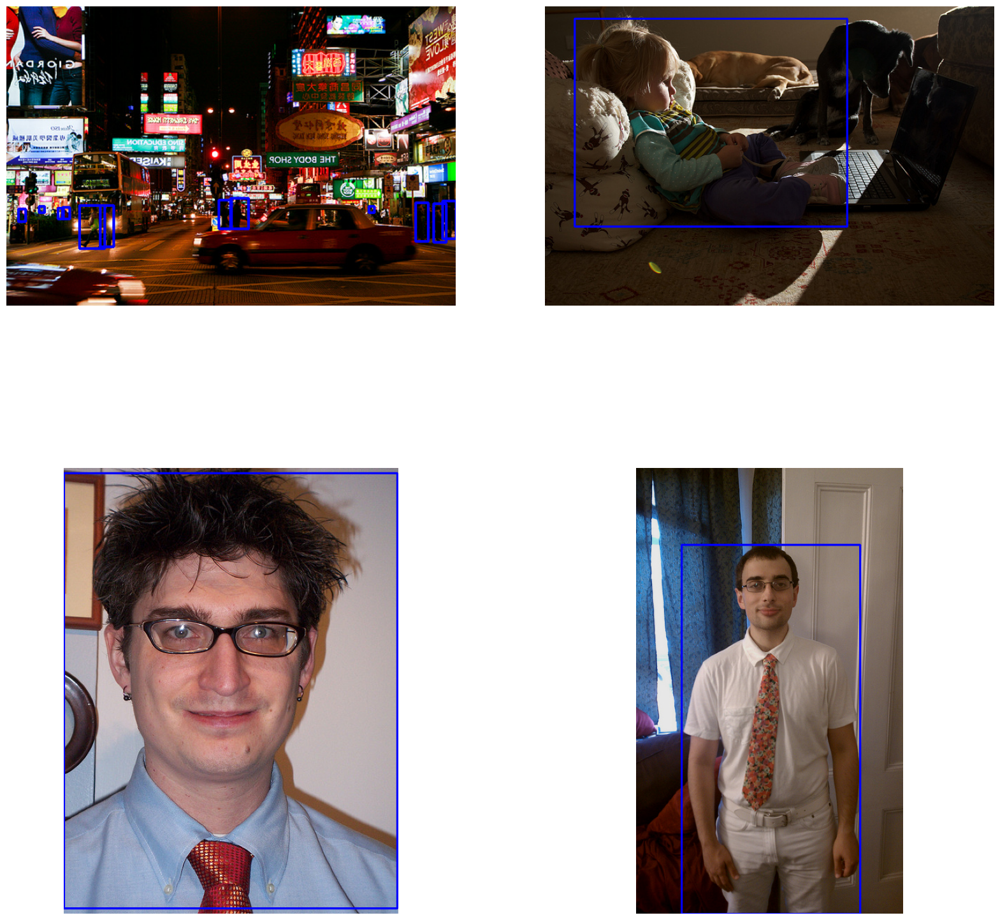

In [23]:
images, targets= next(iter(train_data_loader))
images = list(image.to(device) for image in images)
targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

plt.figure(figsize=(20,20))

for i, (image, target) in enumerate(zip(images, targets)):
    plot_index = (i % 4) + 1  
    plt.subplot(2,2, plot_index)
    boxes = targets[i]['boxes'].cpu().numpy().astype(np.int32)
    sample = images[i].permute(1,2,0).cpu().numpy()
    names = targets[i]['labels'].cpu().numpy().astype(np.int64)
    for i,box in enumerate(boxes):
        cv2.rectangle(sample,
                      (box[0], box[1]),
                      (box[2], box[3]),
                      (0, 0, 220), 2)
#         cv2.putText(sample, classes[names[i]], (box[0],box[1]+15),cv2.FONT_HERSHEY_COMPLEX ,0.5,(0,220,0),1,cv2.LINE_AA)  

    plt.axis('off')
    plt.imshow(sample)

### Download Faster-RCNN Resnet50 Pre-Trained model

In [24]:
# load a model; pre-trained on COCO
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth
100%|██████████| 160M/160M [00:09<00:00, 17.2MB/s] 


In [25]:
# get number of input features for the classifier
in_features = model.roi_heads.box_predictor.cls_score.in_features

print(in_features)

1024


### Modify the model's Region of Interest (ROI) head's box predictor (because we only have 2 class: person & non-person)

In [26]:
num_classes = 2

# replace the pre-trained head with a new one
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

print(model.roi_heads.box_predictor)

FastRCNNPredictor(
  (cls_score): Linear(in_features=1024, out_features=2, bias=True)
  (bbox_pred): Linear(in_features=1024, out_features=8, bias=True)
)


### Define SGD optimizer and Learning Rate scheduler

In [27]:
for param in model.parameters():
    param.requires_grads=False

model.to(device)
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.001, weight_decay=0.0005)
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.1)

### Download training modules

In [28]:
! pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'

  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-build-0zp20zrx
  Running command git clone --filter=blob:none --quiet https://github.com/cocodataset/cocoapi.git /tmp/pip-req-build-0zp20zrx
  Resolved https://github.com/cocodataset/cocoapi.git to commit 8c9bcc3cf640524c4c20a9c40e89cb6a2f2fa0e9
  Preparing metadata (setup.py) ... done
  Created wheel for pycocotools: filename=pycocotools-2.0-cp310-cp310-linux_x86_64.whl size=109312 sha256=edd9560f66bb81b50be12bf1a78ff31224ad1cdbada016fdd3df9464f469aa3c
  Stored in directory: /tmp/pip-ephem-wheel-cache-r93yjlbz/wheels/39/61/b4/480fbddb4d3d6bc34083e7397bc6f5d1381f79acc68e9f3511
Successfully built pycocotools


In [29]:
!git clone https://github.com/pytorch/vision.git

Cloning into 'vision'...
remote: Enumerating objects: 493837, done.
remote: Counting objects: 100% (7447/7447), done.
remote: Compressing objects: 100% (424/424), done.
remote: Total 493837 (delta 7021), reused 7423 (delta 7009), pack-reused 486390
Receiving objects: 100% (493837/493837), 956.42 MiB | 14.64 MiB/s, done.
Resolving deltas: 100% (460256/460256), done.


In [30]:
!cp /kaggle/working/vision/references/detection/utils.py .
!cp /kaggle/working/vision/references/detection/transforms.py .
!cp /kaggle/working/vision/references/detection/coco_eval.py .
!cp /kaggle/working/vision/references/detection/engine.py .
!cp /kaggle/working/vision/references/detection/coco_utils.py .

import utils
from engine import train_one_epoch, evaluate

### Train and evaluate the model.

In [31]:
torch.cuda.empty_cache()

# let's train it for 3 epochs
num_epochs = 3

for epoch in range(num_epochs):
    # train for one epoch, printing every 100 mini-batch
    train_one_epoch(model, optimizer, train_data_loader, device, epoch, print_freq=100)
    # update the learning rate
    lr_scheduler.step()
    # evaluate on the test dataset
    #evaluate(model, valid_data_loader, device=device)

Epoch: [0]  [  0/667]  eta: 0:36:37  lr: 0.000002  loss: 0.9878 (0.9878)  loss_classifier: 0.7672 (0.7672)  loss_box_reg: 0.2056 (0.2056)  loss_objectness: 0.0022 (0.0022)  loss_rpn_box_reg: 0.0127 (0.0127)  time: 3.2945  data: 0.4313  max mem: 8844
Epoch: [0]  [100/667]  eta: 0:11:07  lr: 0.000152  loss: 0.7947 (1.0483)  loss_classifier: 0.4186 (0.6010)  loss_box_reg: 0.3396 (0.3951)  loss_objectness: 0.0169 (0.0240)  loss_rpn_box_reg: 0.0188 (0.0281)  time: 1.1349  data: 0.0178  max mem: 11126
Epoch: [0]  [200/667]  eta: 0:08:51  lr: 0.000302  loss: 0.6694 (0.8989)  loss_classifier: 0.2610 (0.4546)  loss_box_reg: 0.3748 (0.3926)  loss_objectness: 0.0163 (0.0241)  loss_rpn_box_reg: 0.0221 (0.0277)  time: 1.1069  data: 0.0195  max mem: 11129
Epoch: [0]  [300/667]  eta: 0:06:57  lr: 0.000453  loss: 0.5814 (0.8039)  loss_classifier: 0.2051 (0.3763)  loss_box_reg: 0.3543 (0.3772)  loss_objectness: 0.0202 (0.0239)  loss_rpn_box_reg: 0.0240 (0.0265)  time: 1.1699  data: 0.0194  max mem: 111

### Save model's weight

In [32]:
torch.save(model.state_dict(), 'faster_rcnn_state.pth')

### Test Model

In [33]:
# load  a model; pre-trained on COCO
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=False, pretrained_backbone=False)

WEIGHTS_FILE = "faster_rcnn_state.pth"

num_classes = 2

# get number of input features for the classifier
in_features = model.roi_heads.box_predictor.cls_score.in_features

# replace the pre-trained head with a new one
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

# Load the traines weights
model.load_state_dict(torch.load(WEIGHTS_FILE))

model = model.to(device)

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained_backbone' is deprecated since 0.13 and may be removed in the future, please use 'weights_backbone' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights_backbone' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights_backbone=None`.
  warnings.warn(msg)


In [34]:
# Detection function
def obj_detector(img):
    img = cv2.imread(img, cv2.IMREAD_COLOR)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).astype(np.float32)


    img /= 255.0
    img = torch.from_numpy(img)
    img = img.unsqueeze(0)
    img = img.permute(0,3,1,2)
    
    model.eval()

    detection_threshold = 0.70
    
    img = list(im.to(device) for im in img)
    output = model(img)

    for i , im in enumerate(img):
        boxes = output[i]['boxes'].data.cpu().numpy()
        scores = output[i]['scores'].data.cpu().numpy()
        labels = output[i]['labels'].data.cpu().numpy()

        labels = labels[scores >= detection_threshold]
        boxes = boxes[scores >= detection_threshold].astype(np.int32)
        scores = scores[scores >= detection_threshold]

        boxes[:, 2] = boxes[:, 2] - boxes[:, 0]
        boxes[:, 3] = boxes[:, 3] - boxes[:, 1]
    
    sample = img[0].permute(1,2,0).cpu().numpy()
    sample = np.array(sample)
    boxes = output[0]['boxes'].data.cpu().numpy()
    name = output[0]['labels'].data.cpu().numpy()
    scores = output[0]['scores'].data.cpu().numpy()
    boxes = boxes[scores >= detection_threshold].astype(np.int32)
    names = name.tolist()
    
    return names, boxes, sample

In [36]:
import time

Inference time: 0.0800943374633789 (s)
Inference time: 0.0698699951171875 (s)
Inference time: 0.07349610328674316 (s)
Inference time: 0.06171298027038574 (s)
Inference time: 0.07911968231201172 (s)
Inference time: 0.07437419891357422 (s)
Inference time: 0.07234358787536621 (s)
Inference time: 0.07312750816345215 (s)
Inference time: 0.07885527610778809 (s)
Inference time: 0.07227373123168945 (s)
Inference time: 0.07805538177490234 (s)
Inference time: 0.06977558135986328 (s)
Inference time: 0.0723109245300293 (s)
Inference time: 0.07879638671875 (s)
Inference time: 0.07905936241149902 (s)
Inference time: 0.07220458984375 (s)
Inference time: 0.07779383659362793 (s)
Inference time: 0.08001875877380371 (s)
Inference time: 0.0695645809173584 (s)
Inference time: 0.06398248672485352 (s)


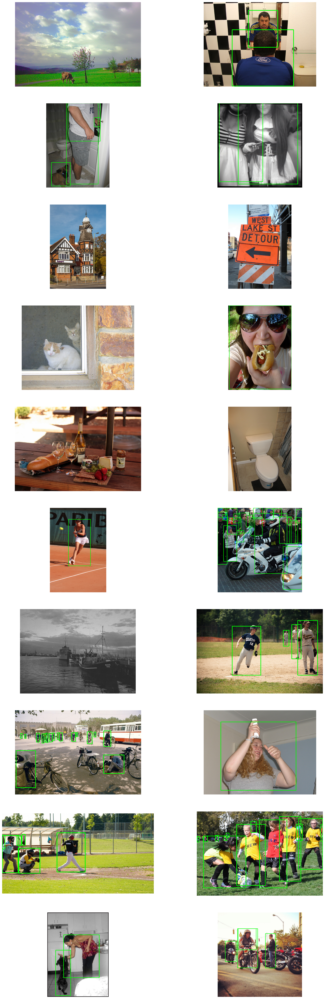

In [59]:
pred_path = "/kaggle/working/data/test/data"
pred_files = [os.path.join(pred_path,f) for f in os.listdir(pred_path)]

plt.figure(figsize=(20,60))

for i, images in enumerate(pred_files):
    if i > 19:break
    plt.subplot(10,2,i+1)
    
    #Perform detection
    t0 = time.time()
    names,boxes,sample = obj_detector(images)
    print(f'Inference time: {time.time() - t0} (s)')
    for i,box in enumerate(boxes):
        cv2.rectangle(sample,
                      (box[0], box[1]),
                      (box[2], box[3]),
                      (0, 220, 0), 2)
        #cv2.putText(sample, classes[names[i]], (box[0],box[1]-5),cv2.FONT_HERSHEY_COMPLEX ,0.7,(220,0,0),1,cv2.LINE_AA)  

    plt.axis('off')
    plt.imshow(sample)
    plt.savefig('save_image.png', bbox_inches='tight')  # if you want to save result